<a href="https://colab.research.google.com/github/Rachhh53/WebNetworkScience/blob/main/Assignment_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MSDS 452
## Assignment 1

* ### Here I am selecting a Wikipedia page through a random generator of wikipedia pages.
* ### However, one may start with a predifined Wikipedia page of one's own choice. In this case, one needs to modify Cell 7 below.
* ### Subsequently, the goal is to find the set of hyperlinks of the original (random) page to other Wikipedia webpages and the graph (directed network) which is formed by all the hyperlinks among the latter webpages. 
* ### To be able to controll the size of this graph, we are setting the minimum and the maximum number of hyperlinks from the original (random) page into a fixed interval of values (parameters n and N below).
* ### At the very end, after running all cells of this notebooks, students are asked to write a short summary of the contents of each one of the webpages to which the original (random) Wikipedia page points.

##Install PyGraphViz

In [1]:
#how to install the pygraphviz module (colab py3)

!sudo apt-get install python-dev graphviz libgraphviz-dev pkg-config #ubuntu command, dones not trasfer to windows.
!sudo pip install pygraphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
pkg-config is already the newest version (0.29.1-0ubuntu2).
python-dev is already the newest version (2.7.15~rc1-1).
graphviz is already the newest version (2.40.1-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk libxdot4
0 upgraded, 8 newly installed, 0 to remove and 20 not upgraded.
Need to get 2,120 kB of archives.
After this operation, 7,128 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libgtk2.0-common all 2.24.3

In [2]:
# There are two wikipedia module in Python:

# To install the first one:
!pip install wikipedia-api

# To install the second:
!pip install wikipedia

# Here, we will be using both modules

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wikipedia-api: filename=Wikipedia_API-0.5.4-py3-none-any.whl size=13477 sha256=9529ed721f15960bd872c36b7205c930e3db7d3d4a3145be1689cc811116176c
  Stored in directory: /root/.cache/pip/wheels/d3/24/56/58ba93cf78be162451144e7a9889603f437976ef1ae7013d04
Successfully built wikipedia-api
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11695 sha256=f5f882b9aa9f7e244e3e1bc5cab573d17943623c08064f13a5b9a4a308a96aeb
  Stored in directory: /root/.cache/pip/wheels/15/93/6d/5b2c68b8a64c7a7a04947b4ed6d89fb557dcc6bc27d1d7f3ba
Successfully built wikipedia


In [3]:
# To install pygraphviz with conda, 
# you need to run the following IN A TERMINAL (after commenting it out):

# conda install -c alubbock pygraphviz

In [4]:
# To install pygraphviz with pip, 
# you need to run the following (after commenting it out):

# !pip install graphviz
# !pip install python-graphvis
# !pip install pygraphviz

In [5]:
import wikipediaapi
wiki_wiki = wikipediaapi.Wikipedia('en')
import wikipedia
import random
import networkx as nx
import matplotlib.pyplot as plt
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
import warnings; warnings.simplefilter('ignore')

In [6]:
n=30  # minimum number of hyperlinks of the selected wikipedia page
N=51  # maximum number of hyperlinks of the selected wikipedia page

### Random Selection of a Wikipedia Page

In [7]:
# If this cell runs very slowly, take lower values of n and N.

while True:
    try:
        page=wiki_wiki.page(wikipedia.random())
#         page=wikipedia.page(wikipedia.random())
    except Error as e:
#     except wikipedia.DisambiguationError as e:
        print(e)
        pass
    except wiki_wiki.exceptions.PageError as e:
#     except wikipedia.exceptions.PageError as e:
        print(e)
        pass
    hl=sorted([w.replace(" ","_") for w in page.links])
    if len(hl)>n and len(hl)<N:
        break
        
p=sorted([w.replace(" ","_") for w in page.links])

print("The %i hyperlinks from the (randomly) selected '%s' Wikipedia page are: \n" %(len(p),page.title))
for i in range(len(p)):
    print("%i. %s" %(i+1,p[i]))

The 48 hyperlinks from the (randomly) selected 'Struga, Lower Silesian Voivodeship' Wikipedia page are: 

1. Battle_of_Struga
2. Category:Articles_with_GND_identifiers
3. Category:Articles_with_VIAF_identifiers
4. Central_European_Summer_Time
5. Central_European_Time
6. Chwaliszów
7. Cieszów,_Lower_Silesian_Voivodeship
8. Cisów,_Lower_Silesian_Voivodeship
9. Daylight_saving_time
10. Geographic_coordinate_system
11. Gmina
12. Gmina_Stare_Bogaczowice
13. Gostków,_Lower_Silesian_Voivodeship
14. Help:Authority_control
15. Help:IPA/Polish
16. Jabłów
17. Kingdom_of_Prussia
18. List_of_Polish_counties
19. List_of_sovereign_states
20. Lower_Silesia
21. Lower_Silesian_Voivodeship
22. Lubomin,_Lower_Silesian_Voivodeship
23. Module:Location_map/data/Poland
24. Module:Location_map/data/Poland_Lower_Silesian_Voivodeship
25. Nowe_Bogaczowice
26. Podgórna,_Lower_Silesian_Voivodeship
27. Poland
28. Polish_Legions_(Napoleonic_period)
29. Spa_town
30. Stare_Bogaczowice
31. Struga
32. Szczawno-Zdrój
33. 

### Using a Predefined Wikipedia Page

In [8]:
# # IF ONE WANTS TO USE A PREDEFINED WEBPAGE, 
# # one should uncomment and run the following lines
# # Here, I've considered as predefined Wikipedia page the page of the
# # 'United_States_women%27s_national_soccer_team' but you may take
# # instead anything you like. Notice, that subsequently I am filtering
# # a random sample of 20 hyperlinks. This might need to change if the
# # page you have selected has fewer hyperlinks.

# page=wikipedia.page('United_States_women%27s_national_soccer_team') #'https://en.wikipedia.org/wiki/United_States_women%27s_national_soccer_team'

# p=random.sample(sorted([w.replace(" ","_") for w in page.links]),20)

# print("The %i hyperlinks from the (randomly) selected '%s' Wikipedia page are: \n" %(len(p),page.title))
# for i in range(len(p)):
#     print("%i. %s" %(i+1,p[i]))

In [9]:
eds=[]
for pp in p:
    try:
        ppp=sorted([w.replace(" ","_") for w in wiki_wiki.page(pp).links])
#         ppp=sorted([w.replace(" ","_") for w in wikipedia.page(pp).links])
    except Error as e:
#     except wikipedia.exceptions.PageError as e:
        print(e)
        pass
    ppp=[x for x in ppp if x!=pp]
    ih=set(ppp).intersection(set(p))
    if len(ih)>0:
        print("%s has %i hyperlinks to webpages: \n %s \n" %(pp,len(ih),", ".join(list(ih))))
        for q in ih:
            eds.append((pp,q))

Category:Articles_with_VIAF_identifiers has 1 hyperlinks to webpages: 
 VIAF_(identifier) 

Central_European_Summer_Time has 4 hyperlinks to webpages: 
 Central_European_Time, Poland, Daylight_saving_time, Time_zone 

Central_European_Time has 3 hyperlinks to webpages: 
 Central_European_Summer_Time, Poland, Daylight_saving_time 

Chwaliszów has 28 hyperlinks to webpages: 
 Gmina_Stare_Bogaczowice, Cisów,_Lower_Silesian_Voivodeship, Template_talk:Wałbrzych-geo-stub, VIAF_(identifier), Poland, Gmina, Cieszów,_Lower_Silesian_Voivodeship, Module:Location_map/data/Poland, Lower_Silesian_Voivodeship, Template:Gmina_Stare_Bogaczowice, Stare_Bogaczowice, Wałbrzych_County, Gostków,_Lower_Silesian_Voivodeship, Nowe_Bogaczowice, Voivodeships_of_Poland, Template:Wałbrzych-geo-stub, Template_talk:Gmina_Stare_Bogaczowice, Jabłów, Wałbrzych, Wikipedia:Stub, Wrony,_Lower_Silesian_Voivodeship, Geographic_coordinate_system, Podgórna,_Lower_Silesian_Voivodeship, Wrocław, Help:IPA/Polish, Help:Authority_

In [10]:
# In case you could not install pygraphviz, replace the command bellow:
# pos=graphviz_layout(G)
# by 
# pos=nx.spring_layout(G,k)
# where you set k equal to 1. or any float less or larger that 1.
# Try a few assignments of k until you find the plot that looks more satisfactory.

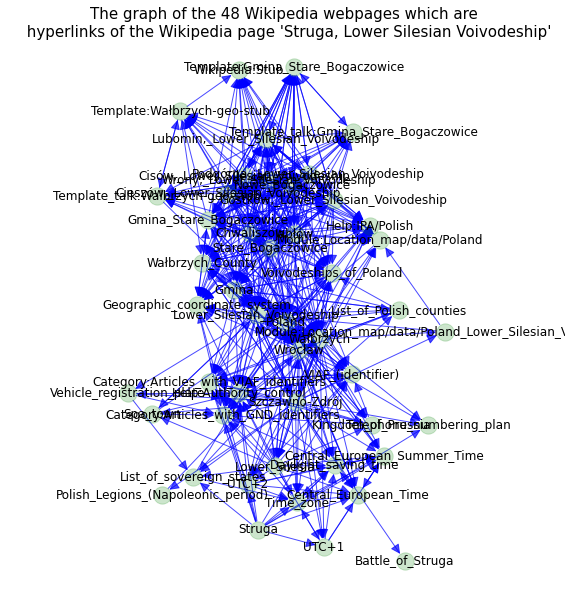

In [11]:
G=nx.DiGraph()
G.add_edges_from(eds)
# print(len(G.nodes()),len(G.edges()))

pos=graphviz_layout(G)

# pos=nx.spring_layout(G,1.)

plt.figure(figsize=(10,10));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.2)
nx.draw_networkx_edges(G, pos,arrowsize=20, edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
ss="The graph of the %i Wikipedia webpages which are \n hyperlinks of the Wikipedia page '%s'" %(len(G.nodes()),page.title)
plt.title(ss,fontsize=15);
plt.margins(x=0.3, y=0) 

In [12]:
!pip install pycountry

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.1 MB 5.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681845 sha256=5e8526512f574d5e986ca8adb76c7b0a128559033240a143ebbfb175bfe8aa33
  Stored in directory: /root/.cache/pip/wheels/0e/06/e8/7ee176e95ea9a8a8c3b3afcb1869f20adbd42413d4611c6eb4
Successfully built pycountry


In [13]:
!pip install a-world-of-countries

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 84 kB 2.6 MB/s 


In [14]:
!pip install datashader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 18.2 MB 839 kB/s 
     |████████████████████████████████| 76 kB 3.9 MB/s 
  Created wheel for datashape: filename=datashape-0.5.2-py3-none-any.whl size=59438 sha256=a9dfe85bacf7094b16c7bb4cd053d45236615e1f12394f2851c33b4b10547060
  Stored in directory: /root/.cache/pip/wheels/b5/b7/80/333a5c3312ed4cd54f5d5b869868c14e0c6002cb5c7238b52d
Successfully built datashape


In [15]:
!pip install hvplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 5.1 MB/s 


Creating /root/.bokeh directory
Creating /root/.bokeh/data directory
Using data directory: /root/.bokeh/data
Downloading: CGM.csv (1589982 bytes)
   1589982 [100.00%]
Downloading: US_Counties.zip (3171836 bytes)
   3171836 [100.00%]
Unpacking: US_Counties.csv
Downloading: us_cities.json (713565 bytes)
    713565 [100.00%]
Downloading: unemployment09.csv (253301 bytes)
    253301 [100.00%]
Downloading: AAPL.csv (166698 bytes)
    166698 [100.00%]
Downloading: FB.csv (9706 bytes)
      9706 [100.00%]
Downloading: GOOG.csv (113894 bytes)
    113894 [100.00%]
Downloading: IBM.csv (165625 bytes)
    165625 [100.00%]
Downloading: MSFT.csv (161614 bytes)
    161614 [100.00%]
Downloading: WPP2012_SA_DB03_POPULATION_QUINQUENNIAL.zip (4816256 bytes)
   4816256 [100.00%]
Unpacking: WPP2012_SA_DB03_POPULATION_QUINQUENNIAL.csv
Downloading: gapminder_fertility.csv (64346 bytes)
     64346 [100.00%]
Downloading: gapminder_population.csv (94509 bytes)
     94509 [100.00%]
Downloading: gapminder_life_e

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
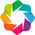

No. of Girvan-Newman communities 3


In [16]:
import random, math, numpy as np, matplotlib.pyplot as plt, pycountry, awoc, pandas as pd  
from collections import Counter
import networkx as nx
from networkx.algorithms import bipartite
from networkx.algorithms import community
import community as louvain

import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from networkx.drawing.nx_agraph import to_agraph

import bokeh
from bokeh.io import push_notebook, show, output_notebook, save
import bokeh.plotting as bp
from bokeh.plotting import figure, save, output_file, show #, from_networkx
from bokeh.models import (ColumnDataSource, LabelSet, Label, BoxSelectTool, Circle, EdgesAndLinkedNodes, HoverTool,MultiLine, 
                          NodesAndLinkedEdges, Plot, Range1d, TapTool,)
from holoviews.element.graphs import layout_nodes
bokeh.sampledata.download()
from bokeh.sampledata.airport_routes import routes, airports

output_notebook()
import holoviews as hv
from holoviews import dim, opts
hv.extension('bokeh', 'matplotlib')
from holoviews.operation import  gridmatrix
from holoviews.operation.datashader import datashade, bundle_graph
from holoviews import Graph, Nodes
from holoviews.plotting.bokeh import GraphPlot, LabelsPlot
import hvplot.networkx as hvnx
import hvplot.pandas

communities_generator = community.girvan_newman(G)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)
lc=sorted(sorted(map(sorted, next_level_communities)), key=len,reverse=True)
partition={n:i for i,c in enumerate(lc) for n in c }
print("No. of Girvan-Newman communities",len(set(partition.values())))
for n in G.nodes():
    G.nodes[n]['Girvan_Newman_community'] = partition[n]
    if (n,n) in G.edges():
        G.nodes[n]['in-degree'] = 0
        G.nodes[n]['hyperlinked from'] = ""
        G.nodes[n]['out-degree'] = 0
        G.nodes[n]['hyperlinking to'] = ""
    else:    
        G.nodes[n]['in-degree'] = G.in_degree(n)
        G.nodes[n]['hyperlinked from'] = ", ".join([str(x) for x in sorted(G.predecessors(n))])
        G.nodes[n]['out-degree'] = G.out_degree(n)
        G.nodes[n]['hyperlinking to'] = ", ".join([str(x) for x in sorted(G.successors(n))])    
        
def hvnx_plot_d(G,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
                title,bundled,nodelabels,xoffset,yoffset,
                arrowhead_length,selection_mode,selection_policy,
                edge_hover_line_color,node_hover_fill_color,
                fontsize,text_font_size, text_color,bgcolor):
    graph = hvnx.draw(G, pos)
    graph.opts(edge_color=edge_color,edge_line_width=edge_line_width,node_size=node_size,node_color='Girvan_Newman_community',node_cmap=node_cmap)
    if bundled==0:                
        graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
        if nodelabels==1:
            labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
            graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))
            return graph
        else:
            return graph
    else:
        graph = bundle_graph(graph)
        graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
        if nodelabels==1:
            labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
            graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))
            return graph
        else:
            return graph  

### 1. Holoviews visualization: non-bundled edges and nodes with labels

In [17]:
bundled=0
nodelabels=1
width=700
height=700
pos=graphviz_layout(G)
node_size=0.5*(10+hv.dim('in-degree'))
node_cmap="tab10"
edge_color='lightgreen'
edge_line_width=1
title="Wikipedia Graph of Hyperlinks"
arrowhead_length=0.01
selection_mode='nodes'
selection_policy="nodes"
edge_hover_line_color='green'
node_hover_fill_color='red'
fontsize={'title': '9pt'}
text_font_size='8pt'
text_color='black'
bgcolor='white'
xoffset=0
yoffset=-3

graph = hvnx_plot_d(G,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
             title,bundled,nodelabels,xoffset,yoffset,
             arrowhead_length,selection_mode,selection_policy,
             edge_hover_line_color,node_hover_fill_color,
             fontsize,text_font_size, text_color,bgcolor)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

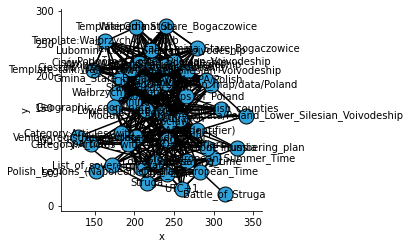

OverlayPlot(apply_extents=True, apply_ranges=True, apply_ticks=True, aspect='square', batched=False, bgcolor=None, data_aspect=None, default_span=2.0, fig_alpha=1.0, fig_bounds=(0.15, 0.15, 0.85, 0.85), fig_inches=4.0, fig_latex=False, fig_rcparams={}, fig_size=100.0, finalize_hooks=[], fontscale=None, fontsize=None, hooks=[], initial_hooks=[], invert_axes=False, invert_xaxis=False, invert_yaxis=False, invert_zaxis=False, labelled=['x', 'y'], legend_cols=None, legend_limit=25, legend_opts={}, legend_position='inner', logx=False, logy=False, logz=False, name='OverlayPlot03139', normalize=True, padding=0.1, projection=None, show_frame=False, show_grid=False, show_legend=True, show_title=True, style_grouping=2, sublabel_format=None, sublabel_position=(-0.35, 0.85), sublabel_size=18, title='{label} {group}\n{dimensions}', title_format=None, xaxis='bottom', xformatter=None, xlabel=None, xlim=(nan, nan), xrotation=None, xticks=None, yaxis='left', yformatter=None, ylabel=None, ylim=(nan, nan)

In [18]:
hv.extension('matplotlib')

mr = hv.renderer('matplotlib')
mr.show(graph)

In [19]:
hv.save(graph, "graph1.html", backend='bokeh')

### 2. Holoviews visualization: bundled edges and nodes without labels

In [20]:
bundled=1
nodelabels=0
width=700
height=700
pos=graphviz_layout(G)
node_size=0.5*(10+hv.dim('in-degree'))
node_cmap="tab10"
edge_color='lightgreen'
edge_line_width=1
title="Wikipedia Graph of Hyperlinks"
arrowhead_length=0.01
selection_mode='nodes'
selection_policy="nodes"
edge_hover_line_color='green'
node_hover_fill_color='red'
fontsize={'title': '9pt'}
text_font_size='8pt'
text_color='black'
bgcolor='white'
xoffset=0
yoffset=-3

graph2 = hvnx_plot_d(G,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
             title,bundled,nodelabels,xoffset,yoffset,
             arrowhead_length,selection_mode,selection_policy,
             edge_hover_line_color,node_hover_fill_color,
             fontsize,text_font_size, text_color,bgcolor)

In [21]:
hv.save(graph2, "graph2.html", backend='bokeh')

#### To remove attributes making the content of the pop up boxes illegible:

In [25]:
G.nodes(data=True)

NodeDataView({'Category:Articles_with_VIAF_identifiers': {'Girvan_Newman_community': 0, 'in-degree': 13, 'out-degree': 1}, 'VIAF_(identifier)': {'Girvan_Newman_community': 0, 'in-degree': 14, 'out-degree': 3}, 'Central_European_Summer_Time': {'Girvan_Newman_community': 0, 'in-degree': 10, 'out-degree': 4}, 'Central_European_Time': {'Girvan_Newman_community': 0, 'in-degree': 11, 'out-degree': 3}, 'Poland': {'Girvan_Newman_community': 0, 'in-degree': 30, 'out-degree': 15}, 'Daylight_saving_time': {'Girvan_Newman_community': 0, 'in-degree': 11, 'out-degree': 5}, 'Time_zone': {'Girvan_Newman_community': 0, 'in-degree': 10, 'out-degree': 5}, 'Chwaliszów': {'Girvan_Newman_community': 0, 'in-degree': 11, 'out-degree': 28}, 'Gmina_Stare_Bogaczowice': {'Girvan_Newman_community': 0, 'in-degree': 14, 'out-degree': 24}, 'Cisów,_Lower_Silesian_Voivodeship': {'Girvan_Newman_community': 0, 'in-degree': 11, 'out-degree': 25}, 'Template_talk:Wałbrzych-geo-stub': {'Girvan_Newman_community': 0, 'in-degre

In [27]:
for (n,d) in G.nodes(data=True):
    del d['in-degree']
    del d['out-degree']
    
bundled=1
nodelabels=0
width=700
height=700
pos=graphviz_layout(G)
node_size=0.5*(10+hv.dim('in-degree'))
node_cmap="tab10"
edge_color='lightgreen'
edge_line_width=1
title="Wikipedia Graph of Hyperlinks"
arrowhead_length=0.01
selection_mode='nodes'
selection_policy="nodes"
edge_hover_line_color='green'
node_hover_fill_color='red'
fontsize={'title': '9'}
text_font_size='8pt'
text_color='black'
bgcolor='white'
xoffset=0
yoffset=-3

graph3 = hvnx_plot_d(G,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
             title,bundled,nodelabels,xoffset,yoffset,
             arrowhead_length,selection_mode,selection_policy,
             edge_hover_line_color,node_hover_fill_color,
             fontsize,text_font_size, text_color,bgcolor)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

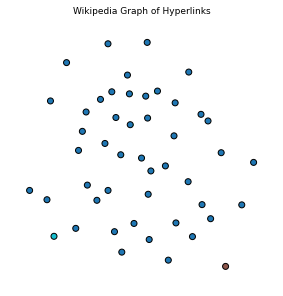

GraphPlot(apply_extents=True, apply_ranges=True, apply_ticks=True, arrowhead_length=0.01, aspect=1.0, bgcolor=None, cbar_extend='neither', cbar_padding=0.01, cbar_ticks=None, cbar_width=0.05, cformatter=None, clabel=None, clim=(nan, nan), clim_percentile=False, clipping_colors={}, cnorm='linear', color_index=None, color_levels=None, colorbar=False, colorbar_opts={}, data_aspect=None, default_span=2.0, directed=True, edge_color_index=None, fig_alpha=1.0, fig_bounds=(0.15, 0.15, 0.85, 0.85), fig_inches=5.333333333333332, fig_latex=False, fig_rcparams={}, fig_size=133.33333333333331, finalize_hooks=[], fontscale=None, fontsize={'title': '9'}, hooks=[], initial_hooks=[], invert_axes=False, invert_xaxis=False, invert_yaxis=False, invert_zaxis=False, labelled=['x', 'y'], logx=False, logy=False, logz=False, name='GraphPlot52471', normalize=True, padding=0.1, projection=None, show_frame=False, show_grid=False, show_legend=True, show_title=True, sublabel_format=None, sublabel_position=(-0.35, 0

In [29]:
hv.extension('matplotlib')

mr = hv.renderer('matplotlib')
mr.show(graph3)

In [28]:
hv.save(graph3, "graph3.html", backend='bokeh')